In [77]:
#Importing relevant packages.
import random 
import sympy as sm
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
import ipywidgets as widgets
from scipy import optimize
from scipy.optimize import minimize
from scipy import interpolate
import pandas as pd

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Linear regression

Consider the following **linear equation:**

$$y_i = \beta_0 + \beta_1 x_{1,i} + \beta_2 x_{2,i} + \epsilon_i$$

Assume you have access to data of the **independent variables** ($x_{1,i}$, $x_{2,i}$) and the **dependent variable** ($y_i$) for $N$ individuals, where $i$ indexes individuals. The variable $\epsilon_i$ is a mean-zero **stochastic shock**.

Assume the **data generating process** is given by:

In [44]:
#Following is the data generating process which generates x1, x2, eps and y with random normal distribution and also removes all large residuals. 
def DGP(N):
    
    # a. independent variables
    x1 = np.random.normal(0,1,size=N)
    x2 = np.random.normal(0,1,size=N)
    
    # b. errors
    eps = np.random.normal(0,1,size=N)
    
    # c. remove large residuals
    extreme = np.random.uniform(0,1,size=N)
    eps[extreme < 0.05] += np.random.normal(-5,1,size=N)[extreme < 0.05]
    eps[extreme > 0.95] += np.random.normal(5,1,size=N)[extreme > 0.95]
    
    # d. dependent variable
    y = 0.1 + 0.3*x1 + 0.5*x2 + eps
    
    return x1, x2, y

**The data you have access to is:**

In [45]:
np.random.seed(2020)
N=10000
x1,x2,y = DGP(N)

**Question 1:** Estimate the vector of coefficients $\mathbf{\beta} = (\beta_0,\beta_1,\beta_2)$ using **ordinary least squares (OLS)** implemented with **matrix algebra** by

$$ \hat{\mathbf{\beta}} = (\mathbf{X}^{\prime}\mathbf{X})^{-1}\mathbf{X}^{\prime}\mathbf{y} $$

where $\mathbf{X}^{\prime}$ is the transpose of $\mathbf{X}$ and

$$\mathbf{y} = 
\pmatrix{ y_1 \cr y_2 \cr  \vdots \cr y_N 
}
, \quad \mathbf{X} = \pmatrix{
1 & x_{1,1} & x_{2,1} \cr 
1 & x_{1,2} & x_{2,2} \cr 
\vdots & \vdots \cr 
1 & x_{1,N} & x_{2,N} 
}$$

We begin by creating the above mentioned variables X, X' and y in order to estimate the OLS coeficient which we will do in the following. 

In [46]:
#Create intersecption.
Inter=np.ones(N, )


#Create X matrix. 
X_T = np.array([Inter, x1, x2])
X = X_T.T #Transpose matrix by .T.

print(X)

[[ 1.         -1.76884571 -0.18279442]
 [ 1.          0.07555227  0.78062368]
 [ 1.         -1.1306297  -1.01220533]
 ...
 [ 1.          0.0370484  -1.44286811]
 [ 1.          1.70892684 -0.10668645]
 [ 1.          2.06128052  0.55908184]]


In [47]:
#Create y matrix
y_T = np.array([y])
y = y.T #Transpose matrix by .T.

print(y)

[-1.06458366  0.58562919 -0.91755295 ... -6.98529298  0.08526139
  0.70458339]


In [48]:
#Calculation of ols coeficient. 
betahat = np.linalg.inv(X.T.dot(X)).dot(X.T).dot(y) #Use linalg.inv to calculate the given equation. 

#Defining each coeficients.
print('betahat_0 is: ', betahat[0])
print('betahat_1 is: ', betahat[1])
print('betahat_2 is: ', betahat[2])

betahat_0 is:  0.09568210492389781
betahat_1 is:  0.29294298771075084
betahat_2 is:  0.5033277126888067


We have now calculated the OLS coeficients for this linear regression. It's clear that x1 has a negative effect on y and vice versa for x2.  

**Question 2:** Construct a 3D plot, where the data is plotted as scattered points, and the prediction of the model is given by the plane

$$\hat{y}_i = \hat{\beta}_0 + \hat{\beta}_1 x_{1,i} + \hat{\beta}_2 x_{2,i}$$

Firstly, we define the above menitioned predition of the model and use the found OLS coeficients to calculate the equation. 

In [49]:
#Defining the general prediction of the model.
yhat=betahat[0]+betahat[1]*x1+betahat[2]*x2

#Now defining prediction of the model where individuals are indexed.
for i in range(N):
    yhat[i]=betahat[0]+betahat[1]*x1[i]+betahat[2]*x2[i] 

print('The predicted y value is ', yhat[i])

The predicted y value is  0.9809211640195744


We now wish to illustrate results so fare in a 3D diagram. 

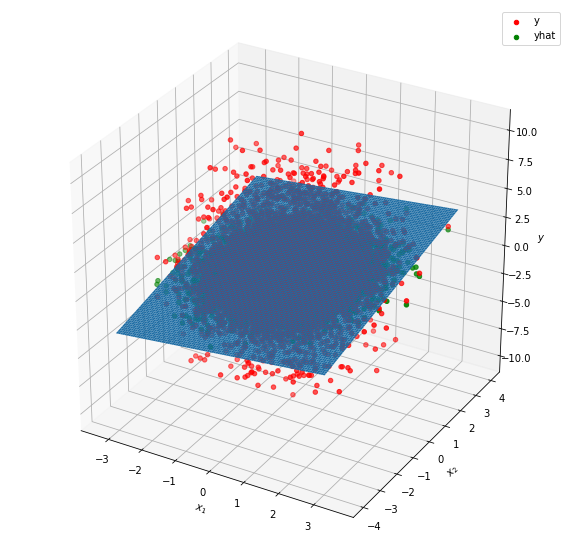

In [50]:
#We create a wiremesh for the plan where the predicted values of the given model will lie on. 
xx = np.linspace(-3,3,100)
yy = np.linspace(-4,4,100)
xx, yy = np.meshgrid(xx,yy)
ypred = betahat[0]+betahat[1]*xx+betahat[2]*yy

#Plotting the 3D-figure. 
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x1, x2, y, color='red', label='y')
ax.scatter(x1, x2, yhat, color='green', label='yhat')
ax.plot_surface(xx,yy,ypred, rstride=1, cstride=1)
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
ax.set_zlabel("$y$")
ax.legend()
plt.show()


The predicted values seem to be some what of from the actual values and we also have some relatively large outliers in our predictions. 

**Question 3:** Esimtate the vector of coefficients $\mathbf{\beta} = (\beta_0,\beta_1,\beta_2)$ using a **numerical solver** to solve the ordinary least square problem, shown below, directly. Compare your results with the matrix algebra results.

$$ \min_{\mathbf{\beta}} \sum^N_{i=1} (y_i - (\beta_0 + \beta_1 x_{1,i} + \beta_2 x_{2,i}) )^2 $$

We will define each symbol using scipcy and afterwards define given function which we will minimize using numerical solver and the OLS method.

In [51]:
#Defining symbols using scipcy (sm).
yi = sm.symbols('y_i')
x1i = sm.symbols('x_{1,i}')
x2i = sm.symbols('x_{2,i}')
beta = sm.symbols('beta')
beta0 = sm.symbols('beta_0')
beta1 = sm.symbols('beta_1')
beta2 = sm.symbols('beta_2')
epsiloni = sm.symbols('epsilon_i')
i = sm.symbols('i')
N = sm.symbols('N')

In [52]:
#Defining the given function.
yi = beta0+beta1*x1i+beta2*x2i+epsiloni
f=np.sum((yi-(beta0+beta1*x1i+beta2*x2i))**2)
f

(beta_0 + beta_1*(x_{1, i}) + beta_2*(x_{2, i}) + epsilon_i - (beta_0 + beta_1*(x_{1, i}) + beta_2*(x_{2, i})))**2

In [53]:
#Solving the problem using minimize. 
def objective(beta):
    return sum((y-(beta[0]+beta[1]*X[:,1]+beta[2]*X[:,2]))**2)
minimize(objective,[0,0,0])

      fun: 37401.576372192016
 hess_inv: array([[ 4.05249292e-05, -4.85968155e-05,  3.09299879e-05],
       [-4.85968155e-05,  5.82767271e-05, -3.70915595e-05],
       [ 3.09299879e-05, -3.70915595e-05,  2.36102364e-05]])
      jac: array([-0.00732422, -0.00048828,  0.00878906])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 575
      nit: 11
     njev: 113
   status: 2
  success: False
        x: array([0.09568183, 0.29294276, 0.50332776])

The results is relatively close to what we recieved in the first question. 

**Question 4:** Estimate the vector of coefficients $\mathbf{\beta} = (\beta_0,\beta_1,\beta_2)$ using **least absolute deviations (LAD)** using a numerical solver to solve the following problem directly: 

$$  \min_{\beta} \sum^N_{i=1} |y_i - (\beta_0 + \beta_1 x_{1,i} + \beta_2 x_{2,i}) | $$

where $|z|$ is the absolute value of $z$.

We again define the given function which we will now minimize using numerical solver and the LAD method.

In [54]:
#Solving the problem using minimize. 
def objective1(beta):
    return sum(np.absolute((y-(beta[0]+beta[1]*X[:,1]+beta[2]*X[:,2]))))
minimize(objective1,[0,0,0])

      fun: 12400.878420532536
 hess_inv: array([[ 3.08060259e-06, -1.20701721e-05, -9.14218396e-06],
       [-1.20701721e-05,  2.04730015e-04,  1.25393884e-04],
       [-9.14218396e-06,  1.25393884e-04,  7.98860294e-05]])
      jac: array([-0.35095215,  2.89111328, -2.11132812])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 480
      nit: 15
     njev: 94
   status: 2
  success: False
        x: array([0.09226388, 0.3074672 , 0.51154355])

We note that the OLS and LAD method diviates somewhat from eachother when we look at the final estimated coeficients. But this isn't such a big concern as it's two different methods of estimation we expect the results to diviate a little bit. 

**Question 5:** Set $N = 50$. Repeat the estimation using the **OLS** and **LAD** methods $K=5000$ times, drawing a new random sample from the data generating process each time. Compare the estimates from each method using histograms. Which method do you prefer? Explain your choice.

We create simulations for OLS and LAD where N=50 and K=5000 and we also note that DGP() draws random samples already.

In [55]:
#Simulate OLS.
sim_OLS = [] #Empty list to save results in. 

#Use a while loop to repeat estimation K times.
k=1
while k<=5000:
    x1,x2,y = DGP(50)
    Inter=np.ones(50, )
    X_T = np.array([Inter, x1, x2])
    X = X_T.T
    y_T = np.array([y])
    y = y.T   
    betahat=np.linalg.inv(X.T.dot(X)).dot(X.T).dot(y)
    sim_OLS.append(betahat)
    k+=1

sim_matrix_OLS=np.array(sim_OLS)
print(sim_matrix_OLS)

[[-0.14246347  0.47301046  0.45514189]
 [ 0.04231504  0.05705522  0.69546867]
 [-0.02748376 -0.28793169  0.36890302]
 ...
 [ 0.08528052  0.378283    0.44025074]
 [ 0.0818325   0.50050533  0.41805993]
 [-0.36740056  0.38317819  0.5384339 ]]


In [56]:
#Simulate LAD. 
sim_LAD = [] #Empty list to save results in.

#Use a while loop to repeat estimation K times.
k=1
while k<=5000:
    x1,x2,y = DGP(50)
    Inter=np.ones(50, )
    X_T = np.array([Inter, x1, x2])
    X = X_T.T
    y_T = np.array([y])
    y = y.T 
    def objective1(beta):
        return sum(np.absolute((y-(beta[0]+beta[1]*X[:,1]+beta[2]*X[:,2]))))
    min=minimize(objective1,[0,0,0])
    betahat=min.x
    sim_LAD.append(betahat)
    k+=1

sim_matrix_LAD=np.array(sim_LAD)
print(sim_matrix_LAD)

[[ 0.10535532  0.04613163  0.46925178]
 [ 0.02536432  0.41430564  1.00027744]
 [ 0.31018424  0.38471599  0.69742508]
 ...
 [ 0.31955506  0.39937338  0.70238023]
 [ 0.03771824  0.46265758  0.24611594]
 [-0.04336352  0.24385031  0.73159372]]


We create two seperate histograms of the estimates using OLS and LAD.

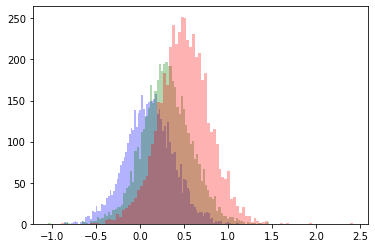

In [57]:
#Split the result of estimating OLS into each coeficient and defining them as lists. 
sim_beta0_OLS = sim_matrix_OLS[:,0]
sim_beta1_OLS = sim_matrix_OLS[:,1]
sim_beta2_OLS = sim_matrix_OLS[:,2]

#Creating histogram.
plt.hist(sim_beta0_OLS, bins=100, label='beta_0', alpha=0.3,color="blue")
plt.hist(sim_beta1_OLS, bins=100, label='beta_1', alpha=0.3, color="green")
plt.hist(sim_beta2_OLS, bins=100, label='beta_2', alpha=0.3, color="red")
plt.show()


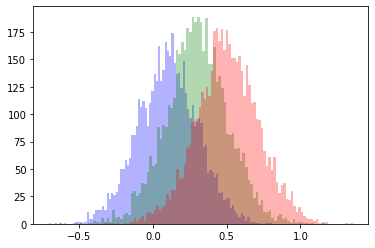

In [58]:
#Split the result of estimating LAD into each coeficient and defining them as lists. 
sim_beta0_LAD = sim_matrix_LAD[:,0]
sim_beta1_LAD = sim_matrix_LAD[:,1]
sim_beta2_LAD = sim_matrix_LAD[:,2]

#Creating histogram.
plt.hist(sim_beta0_LAD, bins=100,label='beta_0', alpha=0.3,color="blue")
plt.hist(sim_beta1_LAD, bins=100,label='beta_1', alpha=0.3, color="green")
plt.hist(sim_beta2_LAD, bins=100,label='beta_2', alpha=0.3, color="red")
plt.show()

Having created lots of loops it's has become quite clear that OLS is a much faster method then LAD when looping. On the other hand it seems that OLS estimation varies alot more then LAD does which is quite clear from the histograms above. 

# Durable purchases

Consider a **household** living in two periods.

In the **second period** it gets utility from **non-durable consumption**, $c$, and **durable consumption**, $d+\chi x$:

$$
\begin{aligned}
v_{2}(m_{2},d)&= \max_{c}\frac{(c^{\alpha}(d+\chi x)^{1-\alpha})^{1-\rho}}{1-\rho}\\
\text{s.t.} \\
x &= m_{2}-c \\
c &\in [0,m_{2}]
\end{aligned}
$$

where 

* $m_2$ is cash-on-hand in the beginning of period 2
* $c$ is non-durable consumption
* $d$ is pre-commited durable consumption
* $x = m_2 - c$ is extra durable consumption
* $\rho > 1$ is the risk aversion coefficient
* $\alpha \in (0,1)$ is the utility weight on non-durable consumption
* $\chi \in (0,1)$ implies that extra durable consumption is *less* valuable than pre-comitted durable consumption
* the second constraint ensures the household *cannot* die in debt

The **value function** $v_2(m_2,d)$ measures the household's value of having $m_2$ at the beginning of period 2 with precomitted durable consumption of $d$. The optimal choice of non-durable consumption is denoted $c^{\ast}(m_2,d)$. The optimal extra durable consumption function is $x^{\ast}(m_2,d) = m_2-c^{\ast}(m_2,d)$.

Define the so-called **end-of-period 1 value function** as:

$$
\begin{aligned}
w(a,d)&\equiv\beta\mathbb{E}_{1}\left[v_2(m_2,d)\right]
\end{aligned}
$$

where 

$$
\begin{aligned}
m_2&= (1+r)a+y \\
y &= \begin{cases}
1-\Delta & \text{with prob. }\frac{1}{3}\\
1 & \text{with prob. }\frac{1}{3}\\
1+\Delta & \text{with prob. }\frac{1}{3}
\end{cases}\\
\end{aligned}
$$

and

* $a$ is assets at the end of period 1
* $\beta > 0$ is the discount factor
* $\mathbb{E}_1$ is the expectation operator conditional on information in period 1
* $y$ is income in period 2
* $\Delta \in (0,1)$ is the level of income risk (mean-preserving)
* $r$ is the return on savings

In the **first period**, the household chooses it's pre-comitted level of durable consumption for the next-period,

$$
\begin{aligned}
v_{1}(m_{1})&=\max_{d} w(a,d)\\&\text{s.t.}&\\
a&= m_{1}-d \\
d&\in [0,m_{1}]\\
\end{aligned}
$$

where $m_1$ is cash-on-hand in period 1. The second constraint ensures the household *cannot* borrow. The **value function** $v_1(m_1)$ measures the household's value of having $m_1$ at the beginning of period 1. The optimal choice of pre-committed durable consumption is denoted $d^{\ast}(m_1)$.

In [59]:
# We have the following parameter values:
rho = 2
alpha = 0.8
beta = 0.96
r = 0.04
Delta = 0.25
chi = 0.9

**Question 1:** Find and plot the functions $v_{2}(m_{2},d)$, $c^{\ast}(m_2,d)$, and $x^{\ast}(m_2,d)$. Comment.

In [60]:
# Defining the value function for period 2
def utility(c,d,m2,alpha,chi,rho):
    x = m2 - c
    return (c**alpha*(d+chi*x)**(1-alpha))**(1-rho)/(1-rho)
def v2(m2,d,rho,alpha,c,chi):
    return utility(c,d,m2,alpha,chi,rho)

# Defining the value function for period 1
def v1(m1,d,Delta,r,beta,v2_interp):
    # Expected v2 value
    m2_low=(1+r)*(m1-d)+1-Delta
    v2_low=v2_interp([m2_low,d])[0]
    # If income is normal
    m2_normal = (1+r)*(m1-d)+1
    v2_normal=v2_interp([m2_normal,d])[0]
    # If income is high
    m2_high = (1+r)*(m1-d)+1+Delta
    v2_high=v2_interp([m2_high,d])[0]
    # Expected v2 value
    v2 = 0.333*v2_low + 0.333*v2_normal + 0.333*v2_high
    # b. Total value
    return beta*v2

In [61]:
# Solving period 2.
# Defining our function:
def solve_period_2(rho,alpha,chi,Delta):
    # a: Implementing grids
    m2_vec = np.linspace(1e-8,10,100)
    d_vec = np.linspace(1e-8,5,100)
    v2_vec = np.empty((100,100))
    c_vec = np.empty((100,100))
    # b: Solve for each m2 and d in grid
    for i, m2 in enumerate(m2_vec):
        for j, d in enumerate(d_vec):
            # i. Objective function
            obj = lambda x: -v2(m2,d,rho,alpha,x[0],chi)
            # ii. Initial value - consume half
            x0 = m2/2
            # iii. Optimize function given the objective function
            result = optimize.minimize(obj,[x0], method='L-BFGS-B', bounds=((1e-8,m2),))
            # iv. Saving value function and optimale consumption
            v2_vec[i,j] = -result.fun
            c_vec[i,j] = result.x 
    return m2_vec, d_vec, v2_vec, c_vec
# Collecting:
m2_vec,d_vec,v2_vec,c_vec = solve_period_2(rho,alpha,chi,Delta)
#Creating grids.
m2_grid, d_grid = np.meshgrid(m2_vec,d_vec,indexing='ij')

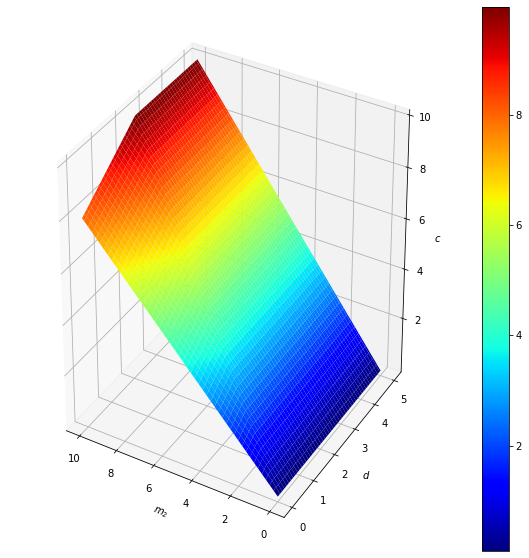

In [62]:
# We will now plot the above functions.
# Ploting c(m2,d)
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1,1,1,projection='3d')
cs = ax.plot_surface(m2_grid,d_grid,c_vec, cmap=cm.jet)
# d. Add labels
ax.set_xlabel('$m_2$')
ax.set_ylabel('$d$')
ax.set_zlabel('$c$')
# Invert xaxis
ax.invert_xaxis()
# Add colorbar
fig.colorbar(cs);

We see that there is a strong correlation between cash on hand in period 2 and consumption in period 2. Futhermore, we see that pre-comitted durable consumption does not seem to effect consumption in period 2.   

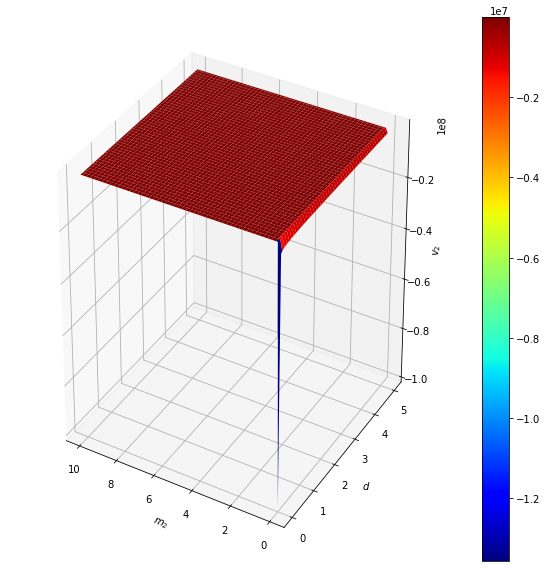

In [63]:
# Plotting x*(m2,d)
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1,1,1,projection='3d')
cs = ax.plot_surface(m2_grid,d_grid,v2_vec, cmap=cm.jet)
# Add labels and limits
ax.set_xlabel('$m_2$')
ax.set_ylabel('$d$')
ax.set_zlabel('$v_2$')
# Invert xaxis
ax.invert_xaxis()
# Add colorbar
fig.colorbar(cs);

We see that as soon as cash on hand and pre-comitted durable consumption is a bit higher than zero, we get a rising value in the households in period 2. If it is zero we notice that they falls drastically. 

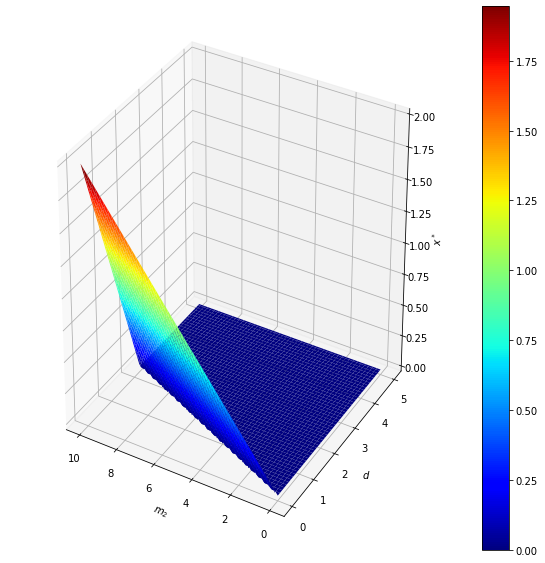

In [64]:
# Plotting v2(m2,d)
# First we define x*:
xstar = m2_grid-c_vec
# The figure:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1,1,1,projection='3d')
cs = ax.plot_surface(m2_grid,d_grid,xstar, cmap=cm.jet)
# Add labels
ax.set_xlabel('$m_2$')
ax.set_ylabel('$d$')
ax.set_zlabel('$x^*$')
# Invert xaxis
ax.invert_xaxis()
# Add colorbar
fig.colorbar(cs);

We notice that va extra durable consumption rises the higher the cash on hand in period 2 and it is not affected by the pre-comitted durable consumption. 

**Question 2:** Find and plot the functions $v_{1}(m_{1})$ and $d^{\ast}(m_1)$. Comment.

In [78]:
# solving period 1.
def solve_period_1(Delta,r,beta,v1,v2_interp):
    # a: Implementing grids
    m1_vec = np.linspace(1e-8,10,100)
    v1_vec = np.empty(100)
    d_star = np.empty(100)
    # b: solve for each m1 in grid
    for i, m1 in enumerate(m1_vec):
        # i. objective function
        obj = lambda x: -v1(m1,x[0],Delta,r,beta,v2_interp)
        # ii. initial value - consume half
        x0 = m1/2
        # iii. optimize function given the objective function
        result=optimize.minimize(obj,[x0], method='L-BFGS-B', bounds=((1e-8,m1),))
            
        # iv. saving value function and optimale consumption
        v1_vec[i] = -result.fun
        d_star[i] = result.x

    return m1_vec,v1_vec,d_star


In [79]:
# constructing interpolator
v2_interp =  interpolate.RegularGridInterpolator((m2_vec,d_vec),v2_vec,bounds_error=False,fill_value=None)
# sloving period 1:
m1_vec,v1_vec,d_star=solve_period_1(Delta,r,beta,v1,v2_interp)

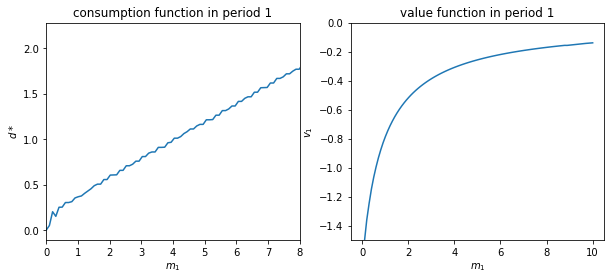

In [80]:
# Plotting the consumption function and the value function for period 1:
# The figure:
fig = plt.figure(figsize=(10,4))
# PLotting the consumption function
ax = fig.add_subplot(1,2,1)
ax.plot(m1_vec,d_star)
# Add labels and limit
ax.set_xlabel('$m_1$')
ax.set_ylabel('$d*$')
ax.set_title('consumption function in period 1')
ax.set_xlim([0,8])
# Plotting the value function:
ax = fig.add_subplot(1,2,2)
ax.plot(m1_vec,v1_vec)
# Adding label and limit
ax.set_xlabel('$m_1$')
ax.set_ylabel('$v_1$')
ax.set_title('value function in period 1')
ax.set_ylim([-1.5,0]);

We see that the more cash on hand in period 1 the higher pre-comitted durable consumption for the consumer. We see that there is a steeper curve when it's only a little cash on hand, and this is because the consumer is not fully rational and the cash on hand could be used on other things such as savings. 
The value function has displays that the more cash on hand, the less negative value does the household have of holding the cash on hand. This development flattens out the more cash on hand though.

**Hint:** For interpolation of $v_2(m_2,d)$ consider using `interpolate.RegularGridInterpolator([GRID-VECTOR1,GRID-VECTOR2],VALUE-MATRIX,bounds_error=False,fill_value=None)`.

Next, consider an **extension** of the model, where there is also a **period 0**. In this period, the household makes a choice whether to stick with the level of durables it has, $z = 0$, or adjust its stock of durables, $z = 1$. If adjusting, the household loses a part of the value of its durable stock; more specificaly it incurs a proportional loss of $\Lambda \in (0,1)$.

Mathematically, the **household problem in period 0** is:

$$
\begin{aligned}
v_{0}(m_{0},d_{0}) &= \max_{z\in\{0,1\}} \begin{cases}
w(m_{0},d_{0}) & \text{if } z = 0\\
v_1(m_0+(1-\Lambda) d_{0}) & \text{if } z = 1\\
\end{cases}\\
\end{aligned}
$$

The **parameters** and **grids** for $m_0$ and $d_0$ should be:

**Question 3:** For which values of $m_0$ and  $d_0$ is the optimal choice not to adjust, i.e. $z = 0$? Show this in a plot. Give an interpretion of your results.

In [87]:
Lambda = 0.2

# we Define value function for period 0, as a function of expected value in period 1, given z=0
def v0_z0(m0,d0,Delta,r,beta,v1_interp):  
    # a. expected v2 value
    m1_low=(1+r)*(m0-d0)+1-Delta
    v1_low=v1_interp([m1_low,d0])[0]
    #If income is normal
    m1_normal = (1+r)*(m0-d0)+1
    v1_normal=v1_interp([m1_normal,d0])[0]
    #If income is high
    m1_high = (1+r)*(m0-d0)+1+Delta
    v1_high=v1_interp([m1_high,d0])[0]
    # expected v2 value
    v1 = 0.333*v1_low + 0.333*v1_normal + 0.333*v1_high
    return beta * v1

# we define value function for period 0, as a function of expected value in period 1, given z=1 
def v0_z1(m0,d0,Delta,r,beta,v1_interp,Lambda):
    # a. expected v2 value
    m1_low=(1+r)*(m0+(1-Lambda)*d0)+1-Delta
    v1_low=v1_interp([m1_low,d0])[0]
    #If income is normal
    m1_normal = (1+r)*(m0+(1-Lambda)*d0)+1
    v1_normal=v1_interp([m1_normal,d0])[0]
    #If income is high
    m1_high = (1+r)*(m0+(1-Lambda)*d0)+1+Delta
    v1_high=v1_interp([m1_high,d0])[0]
    # expected v2 value
    v1 = 0.333*v1_low + 0.333*v1_normal + 0.333*v1_high
    return beta * v1

# we define value function for period 0
def v0(m0,d0,Delta,r,beta,v1_interp,Lambda,z):
    if z == 1:
        return v0_z1(m0,d0,Delta,r,beta,v1_interp,Lambda)
    else: 
        return v0_z0(m0,d0,Delta,r,beta,v1_interp)
        

In [88]:
# Defining grids.
m0_vec = np.linspace(1e-8,6,100)
d0_vec = np.linspace(1e-8,3,100)

# Creating solve-function for periode 0.
def solve(m0_vec, d0_vec,obj_func):
    # grids 
    v0_vec = np.empty((m0_vec.size, d0_vec.size))
    z0_vec = np.empty((m0_vec.size, d0_vec.size))

    for i,m0 in enumerate(m0_vec):
        for j,d0 in enumerate(d0_vec):
            # value of choices
            v0_z0 = obj_func(0, m0, d0)
            v0_z1 = obj_func(1, m0, d0)
            # maximum 
            if v0_z0 > v0_z1:
                v0_vec[i,j]=v0_z0
                z0_vec[i,j]=0
            else:
                v0_vec[i,j]=v0_z1
                z0_vec[i,j]=1

    return v0_vec, z0_vec

In [91]:
#Creating interpolate for v1. 
v1_interp = interpolate.RegularGridInterpolator([m1_vec], v1_vec, bounds_error=False,fill_value=None)

#Solving objective function for periode 0. 
obj_func = lambda z,m0,d0: v0(m0,d0,Delta,r,beta,v1_interp,Lambda,z)
v0_vec, z0_vec = solve(m0_vec, d0_vec,obj_func)

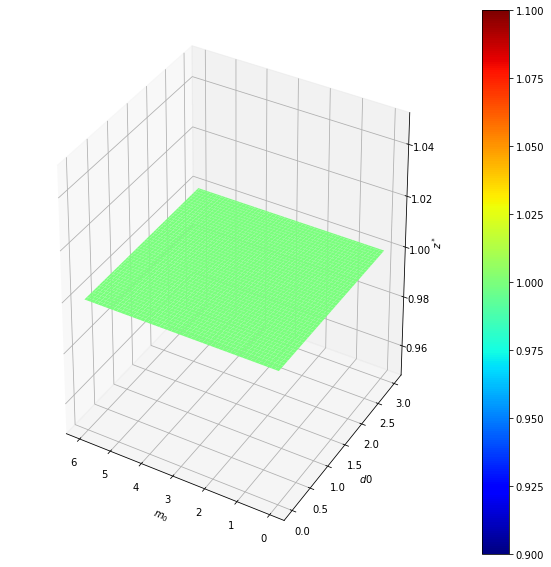

In [90]:
# create grid. 
m0_grid, d0_grid = np.meshgrid(m0_vec,d0_vec,indexing='ij')

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1,1,1,projection='3d')
cs = ax.plot_surface(m0_grid,d0_grid,z0_vec, cmap=cm.jet)

# add labels
ax.set_xlabel('$m_0$')
ax.set_ylabel('$d0$')
ax.set_zlabel('$z^*$')

# invert xaxis
ax.invert_xaxis()

fig.colorbar(cs);

We find that there is no m0 and d0 that makes z=0 to be the optimal choice. This might caused by a small $\Lambda$-value. 


>**note**: The utility function might be wrongly defined but we cound't really point to where the issue in this definition might lie.

# Gradient descent

Let $\boldsymbol{x} = \left[\begin{array}{c}
x_1 \\
x_2\\
\end{array}\right]$ be a two-dimensional vector. Consider the following algorithm:

**Algorithm:** `gradient_descent()`

**Goal:** Minimize the function $f(\boldsymbol{x})$.

1. Choose a tolerance $\epsilon>0$, a scale factor $ \Theta > 0$, and a small number $\Delta > 0$
2. Guess on $\boldsymbol{x}_0$ and set $n=1$
3. Compute a numerical approximation of the jacobian for $f$ by

    $$
    \nabla f(\boldsymbol{x}_{n-1}) \approx \frac{1}{\Delta}\left[\begin{array}{c}
    f\left(\boldsymbol{x}_{n-1}+\left[\begin{array}{c}
    \Delta\\
    0
    \end{array}\right]\right)-f(\boldsymbol{x}_{n-1})\\
    f\left(\boldsymbol{x}_{n-1}+\left[\begin{array}{c}
    0\\
    \Delta
    \end{array}\right]\right)-f(\boldsymbol{x}_{n-1})
    \end{array}\right]
    $$

4. Stop if the maximum element in $|\nabla f(\boldsymbol{x}_{n-1})|$ is less than $\epsilon$
5. Set $\theta = \Theta$ 
6. Compute $f^{\theta}_{n} = f(\boldsymbol{x}_{n-1} - \theta \nabla f(\boldsymbol{x}_{n-1}))$
7. If $f^{\theta}_{n} < f(\boldsymbol{x}_{n-1})$ continue to step 9
8. Set $\theta = \frac{\theta}{2}$ and return to step 6     
9. Set $x_{n} = x_{n-1} - \theta \nabla f(\boldsymbol{x}_{n-1})$
10. Set $n = n + 1$ and return to step 3

**Question:** Implement the algorithm above such that the code below can run.

In the following, we will be following the steps one by one. In the following, we will be following the steps one by one. 

In [85]:
# First, we define the optimizer function we are using
def gradient_descent(f,x0,epsilon=1e-6,Theta=0.1,Delta=1e-8,max_iter=10_000):
    """Function with Gradient descent (optimization algorithm for minimizing the function by iteratively moving towards the steepest descent(negative of the gradient))

    Args: 
        f (callable): Function
        x0 (np.ndarray): Inital values
        epsilon (float): Tolerance
        Theta (float): Scale factor
        Delta (float): Some small number
        max_iter (int): Maximum number of iterations
    Returns:
        x (np.ndarray): minimum
        n (int): number of iterations used
    """
    ## Initialize ##
    # Step 1: The chosen values of epsilon, Theta and Delta are defined in the function above.
    
    # Step 2: Guessing on x0 and setting n=1
    x = x0
    n = 1
    
    ## Iteration ##
    # Step 3-10: # First, we define the optimizer function we are using
    while n < max_iter:
        x_prev = x

        # Step 3: Evaluating the gradient:
        j1 = f(x_prev + np.array([Delta,0]))-f(x_prev)
        j2 = f(x_prev + np.array([0,Delta]))-f(x_prev)
        jacx = (1/Delta)*np.array([j1,j2])
        
        # Step 4: Check convergence:
        if max(abs(jacx)) < epsilon:
            break

        # Step 5: Defining a new variable which we for now set equal to Theta:
        theta = Theta

        # Step 6, 7 and 8: Computing a stepsize and updating theta if needed:
        f_theta = f(x_prev-theta*jacx)
        if f_theta<f(x_prev):
            pass
        else:
            theta=theta/2
            f_theta = f(x_prev-theta*jacx)
        
        # Step 9: Update Guess:
        x=x_prev - theta*jacx

        # Step 10: Update n:
        n += 1
    return x,n

**Test case:**

In [86]:
def rosen(x):
    return (1.0-x[0])**2+2*(x[1]-x[0]**2)**2

x0 = np.array([1.1,1.1])
try:
    x,it = gradient_descent(rosen,x0)
    print(f'minimum found at ({x[0]:.4f},{x[1]:.4f}) after {it} iterations')
    assert np.allclose(x,[1,1])
except:
    print('not implemented yet')

minimum found at (1.0000,1.0000) after 306 iterations


So, testing our implemented algorithm results in finding a minimum at (1,1) after 306 iterations.